In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from imutils import paths
import numpy as np
import argparse
import imutils
import cv2
import os

In [2]:
from matplotlib import pyplot as plt

In [3]:
def create_gaborfilter():
    # This function is designed to produce a set of GaborFilters 
    # an even distribution of theta values equally distributed amongst pi rad / 180 degree
     
    filters = []
    num_filters = 16
    ksize = 35  # The local area to evaluate
    sigma = 3.0  # Larger Values produce more edges
    lambd = 10.0
    gamma = 0.5
    psi = 0  # Offset value - lower generates cleaner results
    for theta in np.arange(0, np.pi, np.pi / num_filters):  # Theta is the orientation for edge detection
        kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_64F)
        kern /= 1.0 * kern.sum()  # Brightness normalization
        filters.append(kern)
    return filters

In [4]:
def apply_filter(img, filters):
# This general function is designed to apply filters to our image
     
    # First create a numpy array the same size as our input image
    newimage = np.zeros_like(img)
     
    # Starting with a blank image, we loop through the images and apply our Gabor Filter
    # On each iteration, we take the highest value (super impose), until we have the max value across all filters
    # The final image is returned
    depth = -1 # remain depth same as original image
     
    for kern in filters:  # Loop through the kernels in our GaborFilter
        image_filter = cv2.filter2D(img, depth, kern)  #Apply filter to image
         
        # Using Numpy.maximum to compare our filter and cumulative image, taking the higher value (max)
        np.maximum(newimage, image_filter, newimage)
    return newimage

In [5]:
# the data and label lists
#desc = LocalBinaryPatterns(24, 8)
data = []
print("[INFO] describing images...")
train_dir = "/home/hifzhil/myWork/DSEC/Dataset/dataset"
#labels = []

[INFO] describing images...


In [6]:
def showimage(myimage, figsize=[10,10]):
    if (myimage.ndim>2):  #This only applies to RGB or RGBA images (e.g. not to Black and White images)
        myimage = myimage[:,:,::-1] #OpenCV follows BGR order, while matplotlib likely follows RGB order
         
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(myimage, cmap = 'gray', interpolation = 'bicubic')
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

In [ ]:
#test gabor effect
image = cv2.imread("/home/hifzhil/myWork/DSEC/Dataset/dataset/)

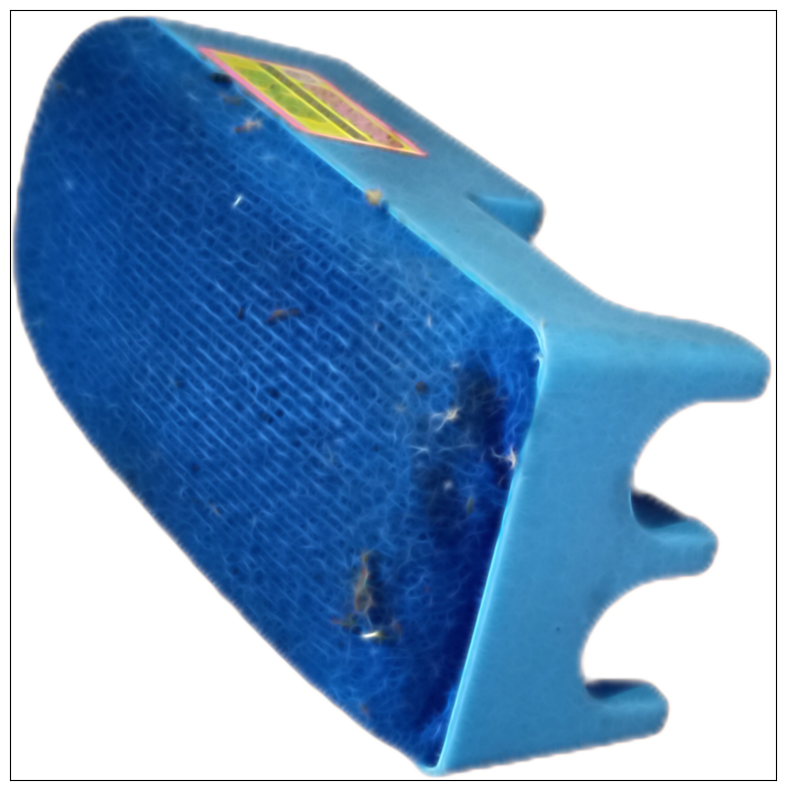

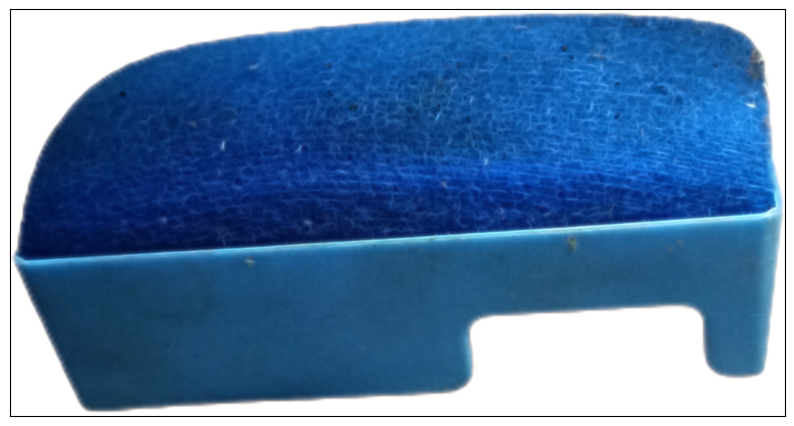

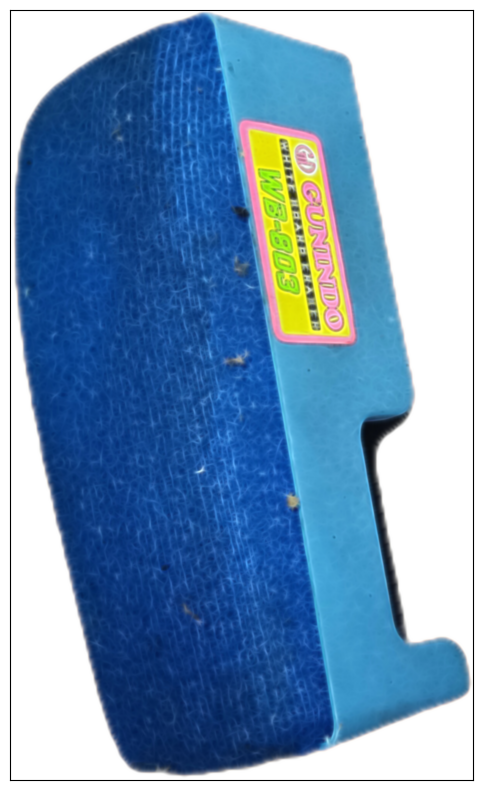

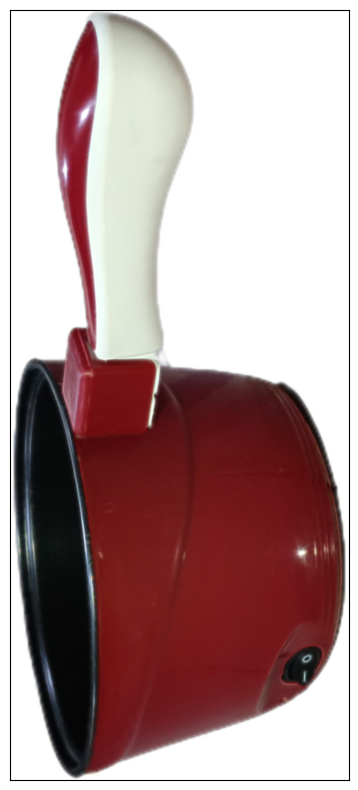

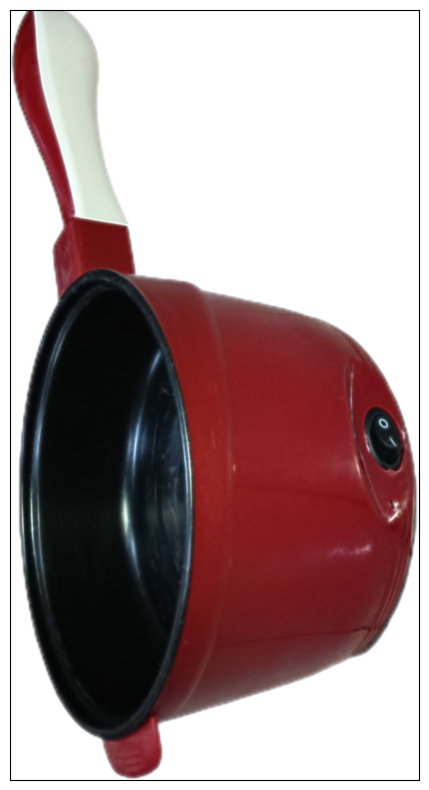

...

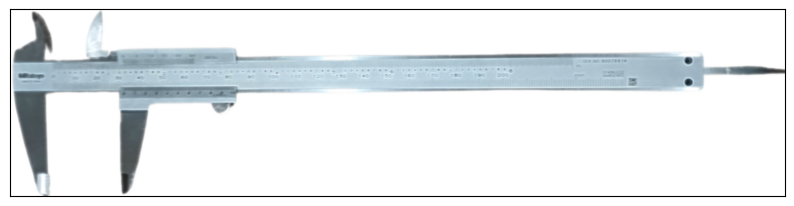

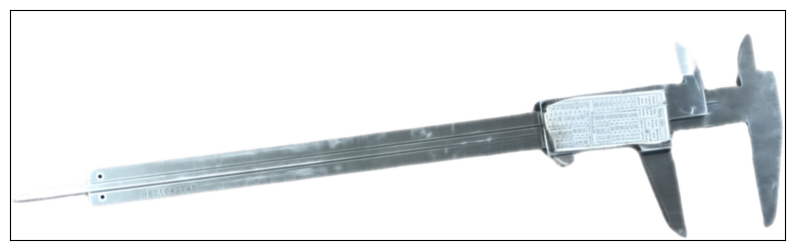

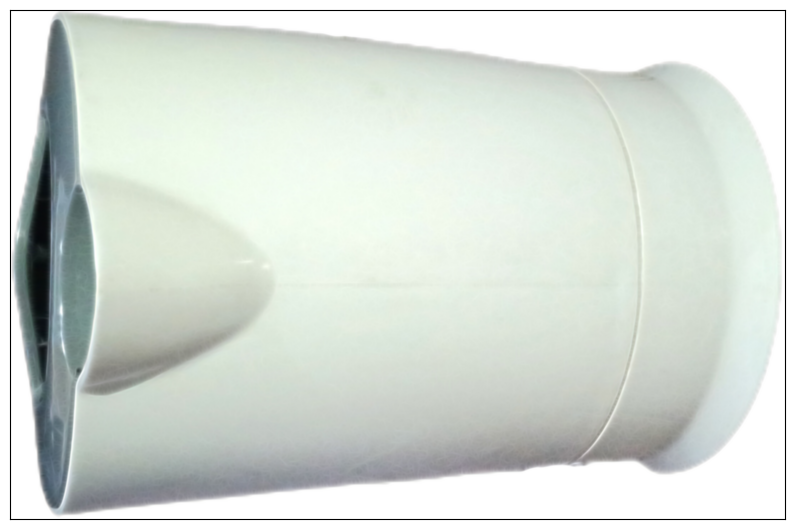

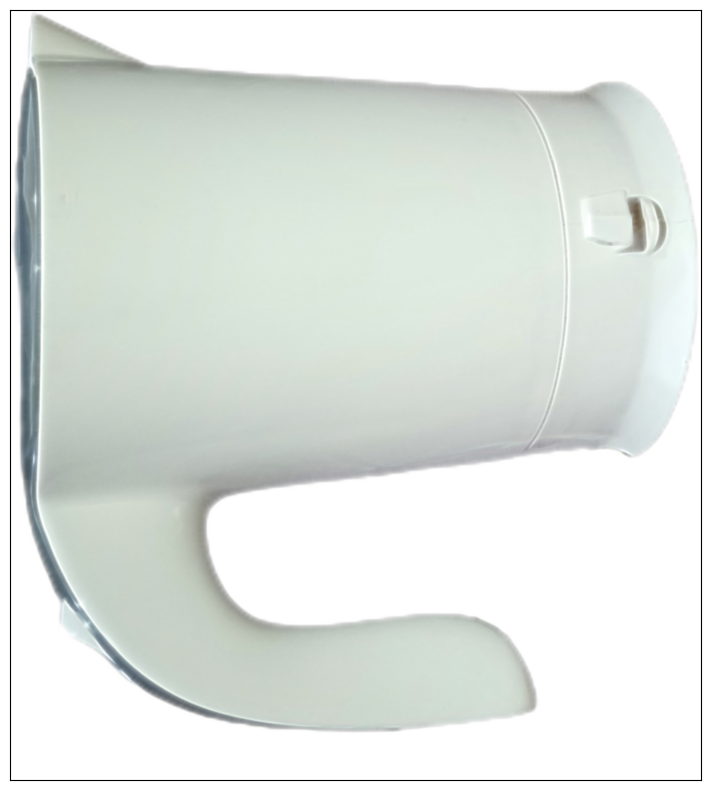

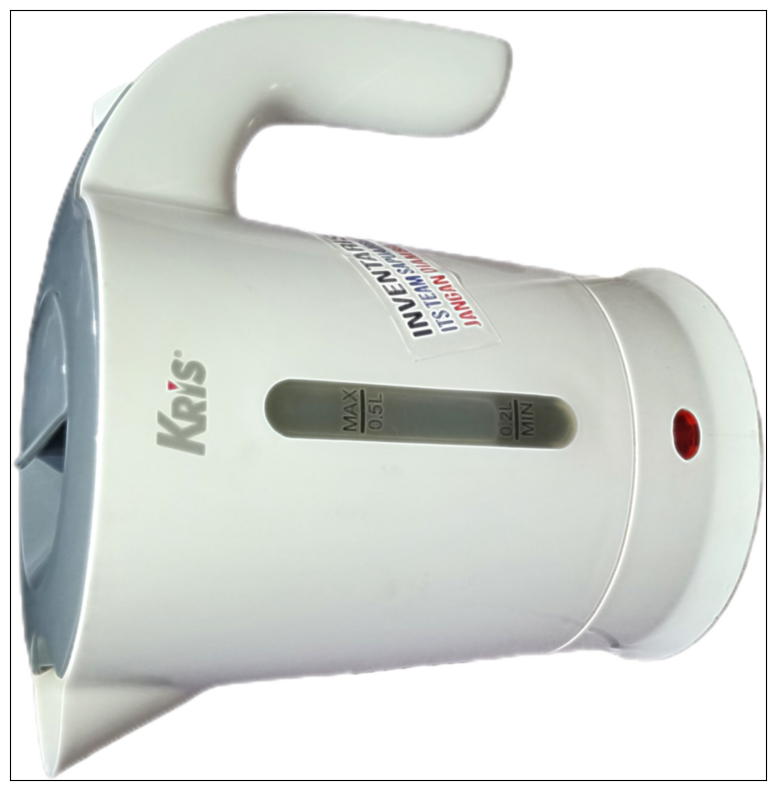

In [21]:
for imagePath in paths.list_images(train_dir):
    # We create our gabor filters, and then apply them to our image
    image = cv2.imread(imagePath)
    gfilters = create_gaborfilter()
    image_g = apply_filter(image, gfilters)
    showimage(image_g)
#     cv2.waitKey(0)
#     if cv2.waitKey(30) & 0xFF == 27:  # Tekan 'Esc' untuk keluar
#         break
# cv2.destroyAllWindows()